In [1]:
from tensorflow.keras.applications.resnet import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications import imagenet_utils
from imutils.object_detection import non_max_suppression

import numpy as np
import imutils
import time
import cv2

In [2]:
from skimage.feature import hog

# Get HOG features 
def get_hog_features(data):
    features = []
    for image in data:
        _, img = hog(image, orientations=15, pixels_per_cell=(2, 2), cells_per_block=(8, 8), block_norm='L2', feature_vector=False, visualize = True, channel_axis=-1)
        features.append(img)
    return np.array(features)

In [3]:
import skimage.data
from skimage import io
import skimage.util as util
#!pip3 install selectivesearch
import selectivesearch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def get_regions_propsal(img):
    
    #get region proposal using selective search
    _, regions = selectivesearch.selective_search(img, scale=500, sigma=0.9, min_size=128)
    
    #show the original image
    plt.imshow(img)
    plt.show()
    
    print("There is %d regions proposed"%len(regions))
    
    #crop the original image according to the regions proposed and store it to a new array
    candidates=set()
    regions_proposal=list()
    for r in regions:
        if r['size'] < 3000:
            continue
        if r['rect'] in candidates:
            continue
        rect = r['rect']
        y1 = rect[0]
        y2 = rect[0] + rect[2]
        x1 = rect[1]
        x2 = rect[1] + rect[3]
        cropped_im = img[x1:x2,y1:y2]
        regions_proposal += [(cropped_im,rect)]
        candidates.add(r['rect'])
    
    return regions_proposal, regions

In [4]:
def jaccard_index(true_box, predicted_box):
    y_a = max(true_box[0], predicted_box[0])
    x_a = max(true_box[1], predicted_box[1])
    y_b = min(true_box[2], predicted_box[2])
    x_b = min(true_box[3], predicted_box[3])
    
    inter_area = max(0, x_b - x_a + 1) * max(0, y_b - y_a + 1)
    
    true_area = (true_box[3] - true_box[1] + 1) * (true_box[2] - true_box[0] + 1)

    pred_area = (predicted_box[3] - predicted_box[1] + 1) * (predicted_box[2] - predicted_box[0] + 1)
    
    iou = inter_area / float(true_area + pred_area - inter_area)
    
    return max(iou, 0)

In [5]:
def ShowRegionProposal(region, img):  
    candidates = set()
    for r in region:
        # distorted rects
        #x, y, w, h = r['rect']
        #if w / h > 1.2 or h / w > 1.2:
        #    continue
        candidates.add(r['rect'])

    # draw rectangles on the original image
    fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(6, 6))
    for x, y, w, h in candidates:
        #print(x, y, w, h)
        rect = mpatches.Rectangle(
            (x, y), w, h, fill=False, edgecolor='red', linewidth=1)
        ax.add_patch(rect)
    ax.imshow(img)
    plt.show()

In [6]:
import os
base_dir = 'data'

# Directory with our test pokemon pictures
test_dir = os.path.join(base_dir, 'test')

test_fnames = os.listdir(test_dir)
test_fnames.sort()

print('total test images:', len(os.listdir(test_dir)))

import glob # glob patterns specify sets of filenames with wildcard characters
import matplotlib.pyplot as plt
from PIL import Image
from keras.preprocessing import image
#!pip3 install keras
#!pip3 install tensorflow
from keras.preprocessing.image import load_img, img_to_array, array_to_img
%matplotlib inline

#IMG_DIM = (224, 224)

test_files = glob.glob(test_dir+"/*")
#test_imgs = [img_to_array(load_img(img, target_size=IMG_DIM)) for img in test_files]
#test_imgs = np.array(test_imgs)
#test_imgs = test_imgs.reshape(len(test_imgs), 224,224, 3)
test_labels = [fn.split('/')[-1].split('.')[0].strip() for fn in test_files]

#print('Test dataset shape:', test_imgs.shape)
#test_imgs_scaled = test_imgs.astype('float32')
#test_imgs_scaled /= 255

#print(test_imgs[0].shape)

from keras.models import load_model

model = load_model("model1.hdf5")
classes = ['Abra', 'Arcanine', 'Bulbasaur','Ditto', 'Eevee', 'Gastly', 'Gengar', 'Jigglypuff','Other', 'Pikachu']
colors = [(247, 255, 0), (255,171,0), (0,255,17), (255,0,196), (240,209,104), (227,104,240), (60,20,255), (255,144,215), (255,255,255), (220,255,0)]

confidence = 0.99

total test images: 72


In [7]:
test_info = {}
with open("C:\\Users\\rajno\\Desktop\\pokemon-detection-and-classification\\data\\labels.txt") as f:
    for line in f:
        (file, class_name, x1, y1, x2, y2 ) = line.split()
        if file in test_info:
            test_info[file].append((class_name, x1, y1, x2, y2))
        else:
            test_info[file] = [(class_name, x1, y1, x2, y2)]
#print(test_info)

00000118.jpg


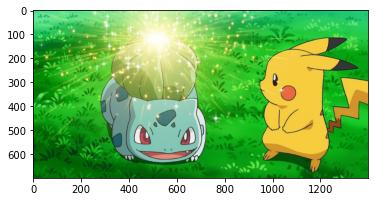

There is 611 regions proposed
All image regions have been created


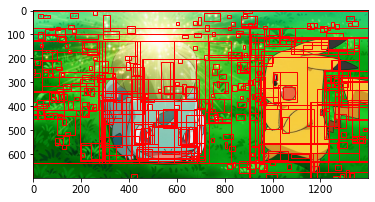

[INFO] classifying ROIs...
00000155.jpg


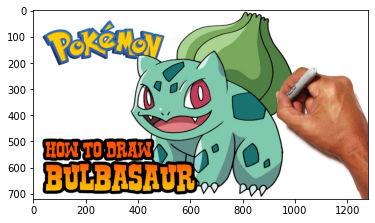

There is 489 regions proposed
All image regions have been created


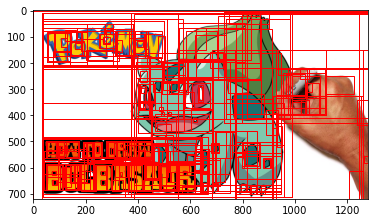

[INFO] classifying ROIs...
00000192.jpg


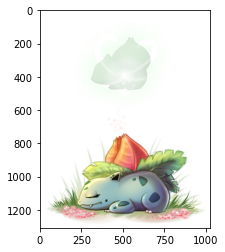

There is 211 regions proposed
All image regions have been created


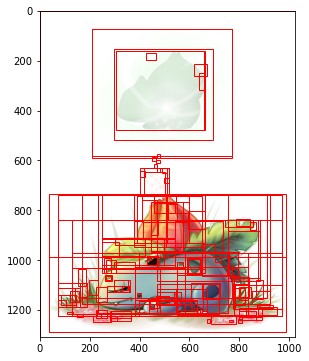

[INFO] classifying ROIs...
00000206.jpg


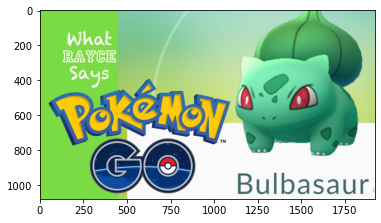

There is 646 regions proposed
All image regions have been created


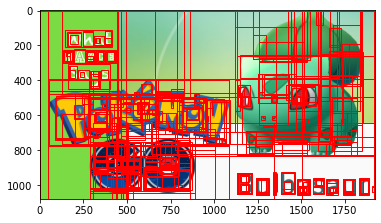

[INFO] classifying ROIs...
00000209.jpg


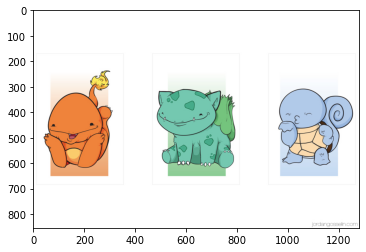

There is 313 regions proposed
All image regions have been created


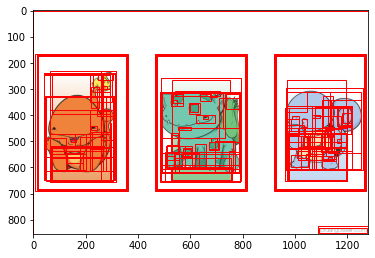

[INFO] classifying ROIs...
1.jpg


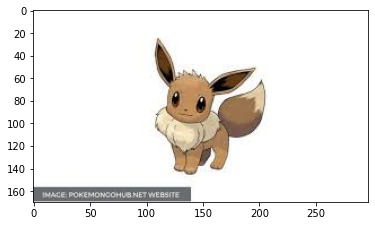

There is 34 regions proposed
All image regions have been created


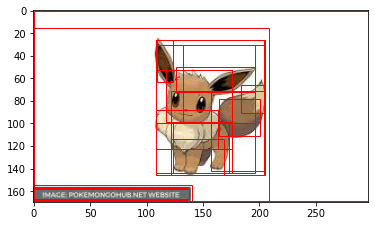

[INFO] classifying ROIs...
10.jpg


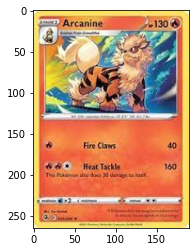

There is 71 regions proposed
All image regions have been created


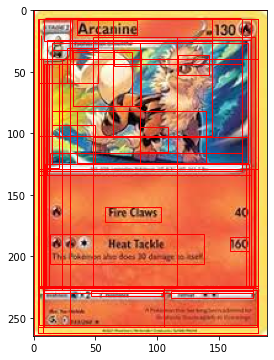

[INFO] classifying ROIs...
11.jpg


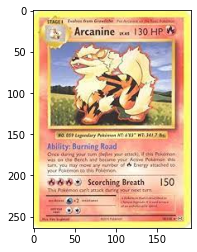

There is 79 regions proposed
All image regions have been created


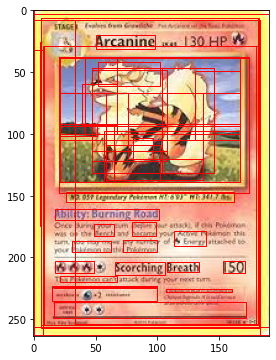

[INFO] classifying ROIs...
12.jpg


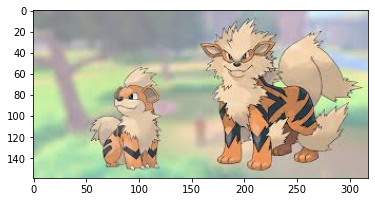

There is 33 regions proposed
All image regions have been created


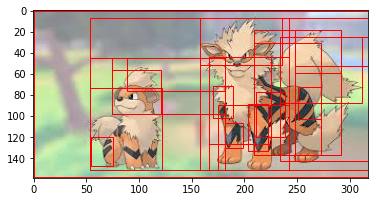

[INFO] classifying ROIs...
13.jpg


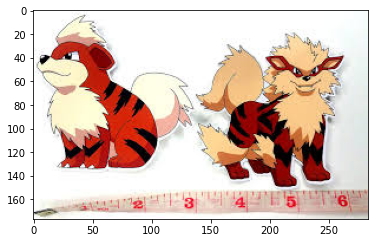

There is 71 regions proposed
All image regions have been created


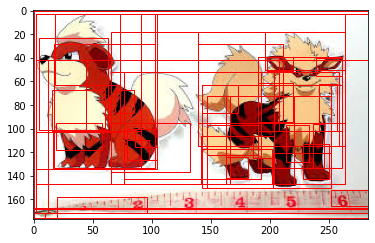

[INFO] classifying ROIs...
14.jpg


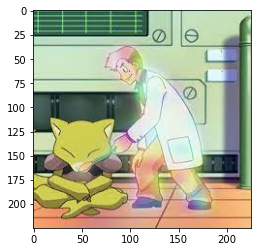

There is 83 regions proposed
All image regions have been created


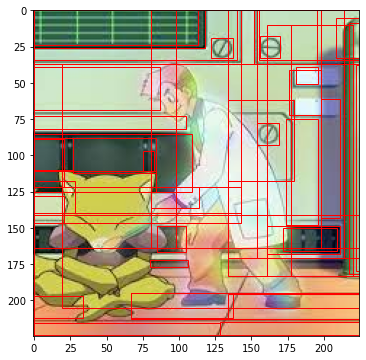

[INFO] classifying ROIs...
15.jpg


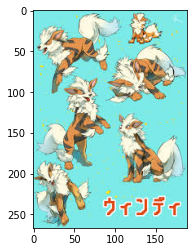

There is 55 regions proposed
All image regions have been created


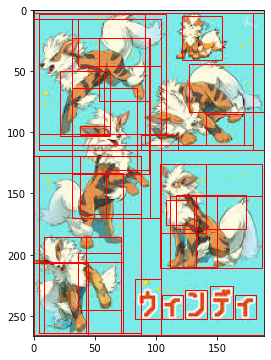

[INFO] classifying ROIs...
16.jpg


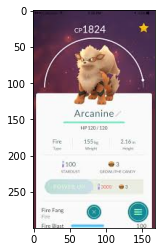

There is 68 regions proposed
All image regions have been created


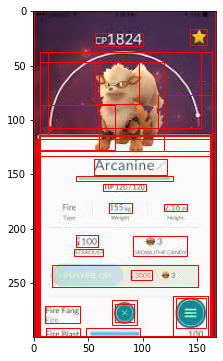

[INFO] classifying ROIs...
17.jpg


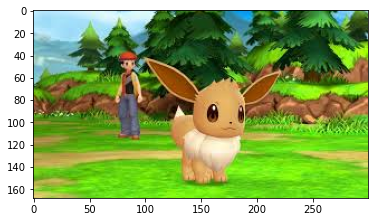

There is 53 regions proposed
All image regions have been created


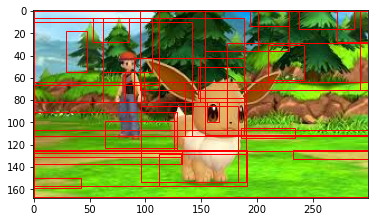

[INFO] classifying ROIs...
18.jpg


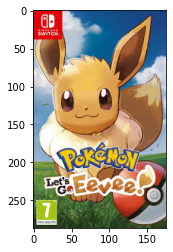

There is 83 regions proposed
All image regions have been created


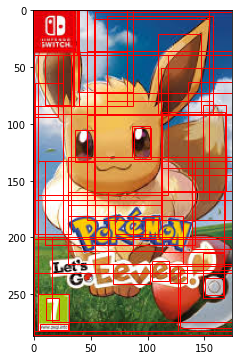

[INFO] classifying ROIs...
19.jpg


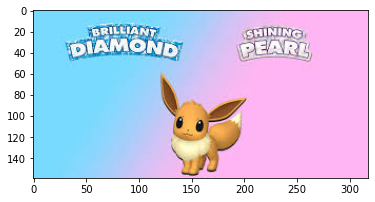

There is 19 regions proposed
All image regions have been created


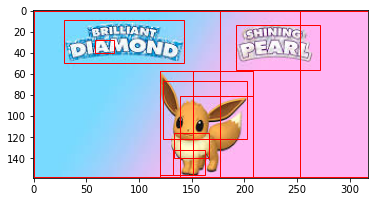

[INFO] classifying ROIs...
2.jpg


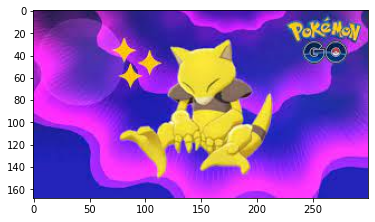

There is 49 regions proposed
All image regions have been created


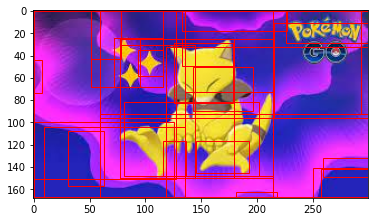

[INFO] classifying ROIs...
20.jpg


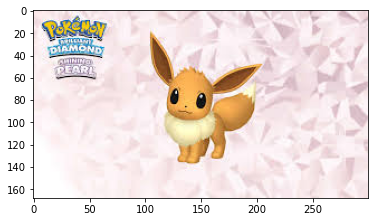

There is 33 regions proposed
All image regions have been created


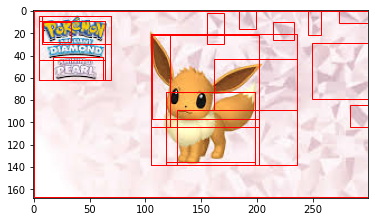

[INFO] classifying ROIs...
21.jpg


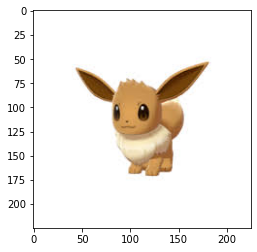

There is 19 regions proposed
All image regions have been created


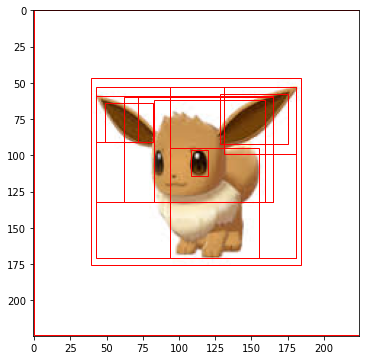

[INFO] classifying ROIs...
22.jpg


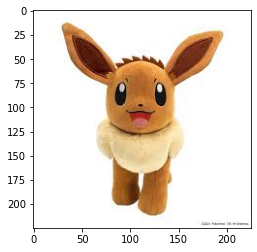

There is 25 regions proposed
All image regions have been created


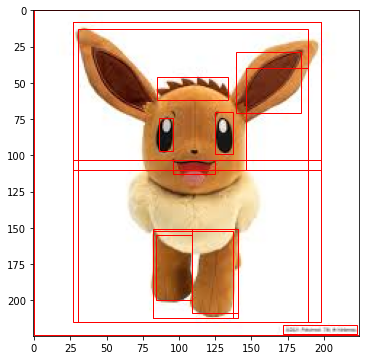

[INFO] classifying ROIs...
24.jpg


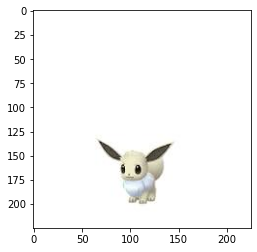

There is 9 regions proposed
All image regions have been created


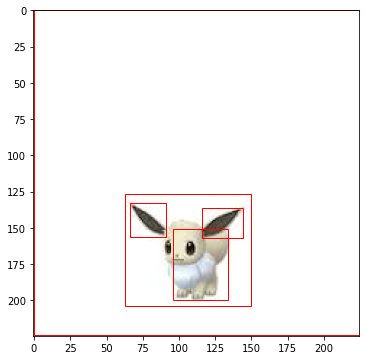

[INFO] classifying ROIs...
25.jpg


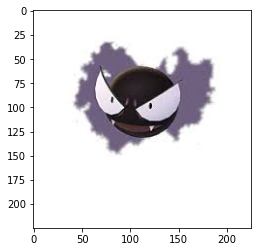

There is 25 regions proposed
All image regions have been created


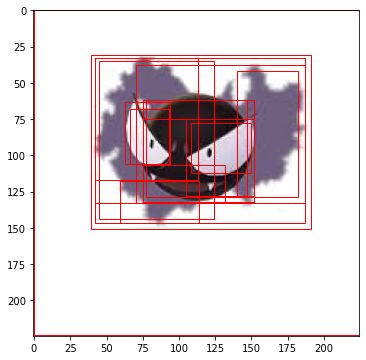

[INFO] classifying ROIs...
26.jpg


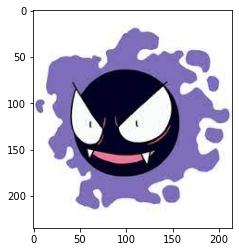

There is 41 regions proposed
All image regions have been created


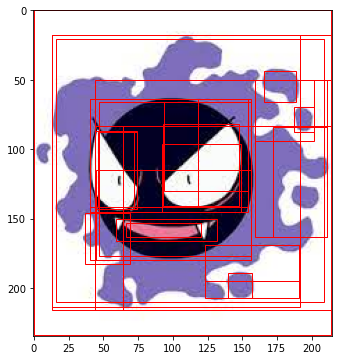

[INFO] classifying ROIs...
27.jpg


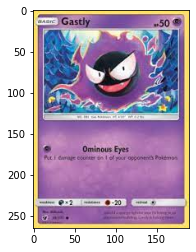

There is 89 regions proposed
All image regions have been created


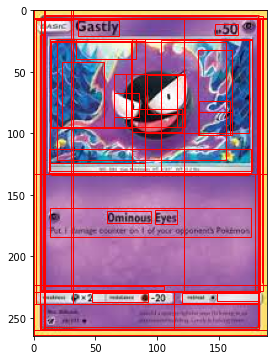

[INFO] classifying ROIs...
3.jpg


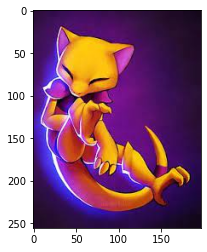

There is 27 regions proposed
All image regions have been created


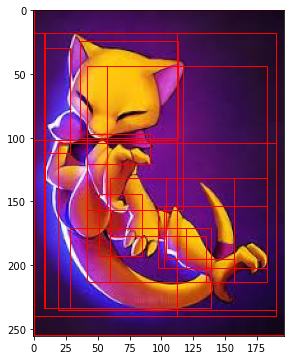

[INFO] classifying ROIs...
30.jpg


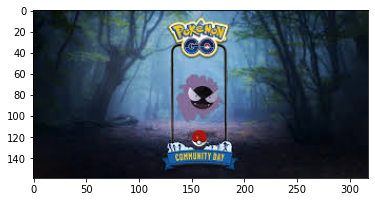

There is 39 regions proposed
All image regions have been created


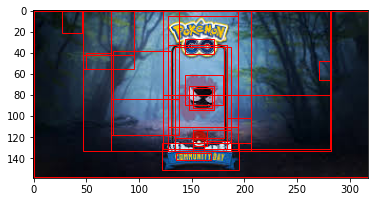

[INFO] classifying ROIs...
31.jpg


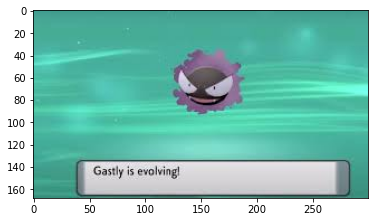

There is 44 regions proposed
All image regions have been created


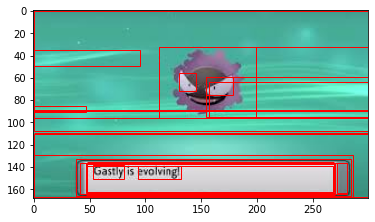

[INFO] classifying ROIs...
32.jpg


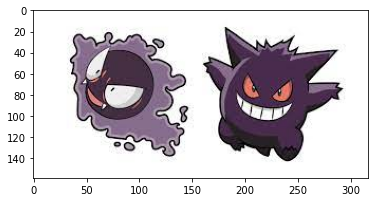

There is 35 regions proposed
All image regions have been created


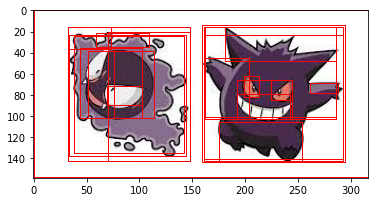

[INFO] classifying ROIs...
33.jpg


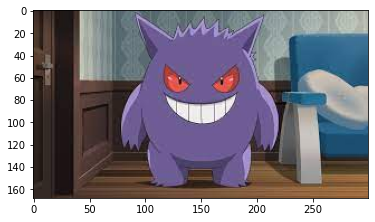

There is 67 regions proposed
All image regions have been created


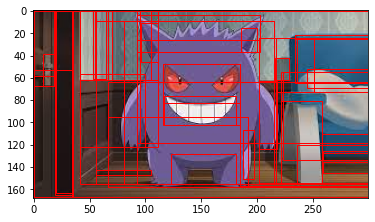

[INFO] classifying ROIs...
34.jpg


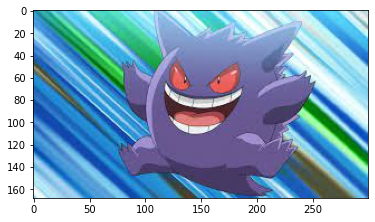

There is 71 regions proposed
All image regions have been created


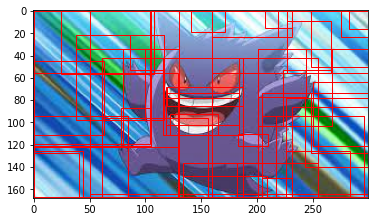

[INFO] classifying ROIs...
35.jpg


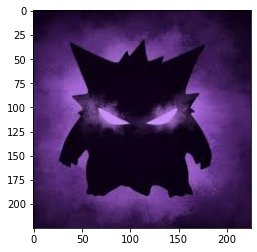

There is 17 regions proposed
All image regions have been created


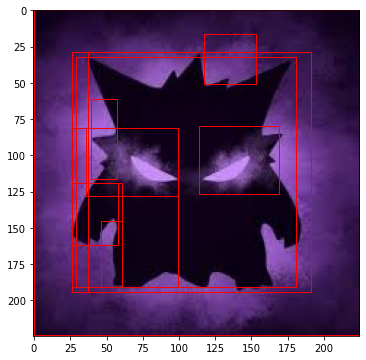

[INFO] classifying ROIs...
36.jpg


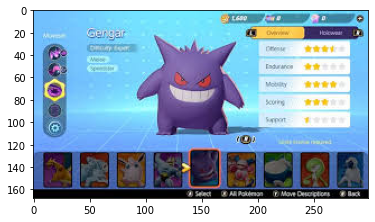

There is 109 regions proposed
All image regions have been created


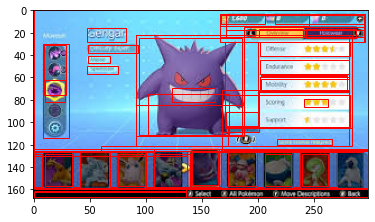

[INFO] classifying ROIs...
37.jpg


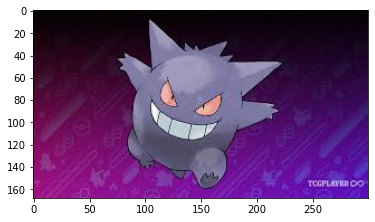

There is 27 regions proposed
All image regions have been created


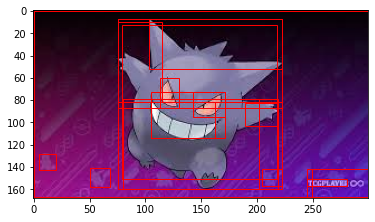

[INFO] classifying ROIs...
38.jpg


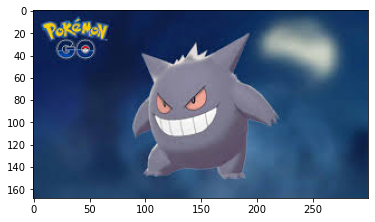

There is 25 regions proposed
All image regions have been created


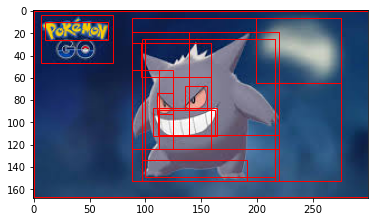

[INFO] classifying ROIs...
39.jpg


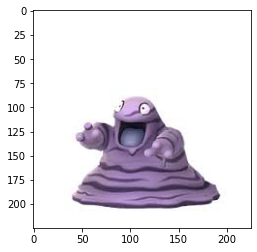

There is 21 regions proposed
All image regions have been created


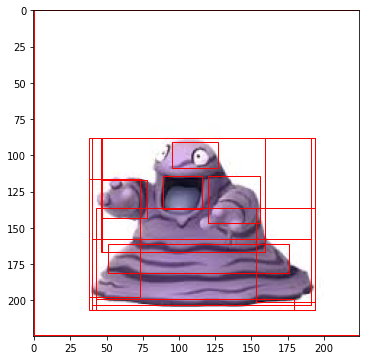

[INFO] classifying ROIs...
4.jpg


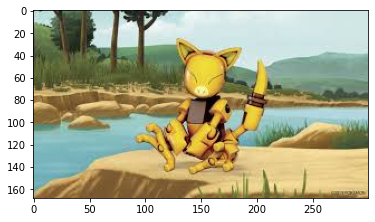

There is 55 regions proposed
All image regions have been created


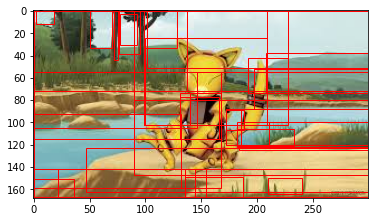

[INFO] classifying ROIs...
40.jpg


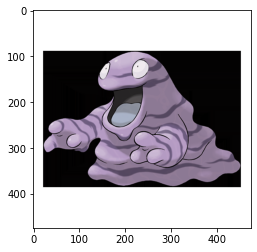

There is 131 regions proposed
All image regions have been created


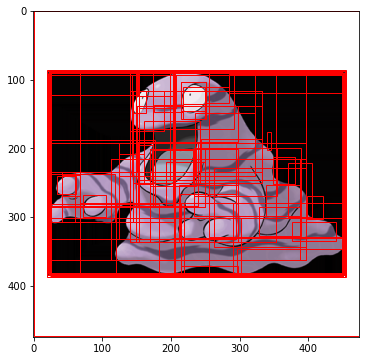

[INFO] classifying ROIs...
41.jpg


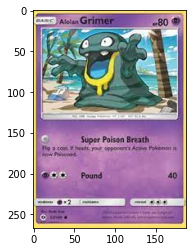

There is 98 regions proposed
All image regions have been created


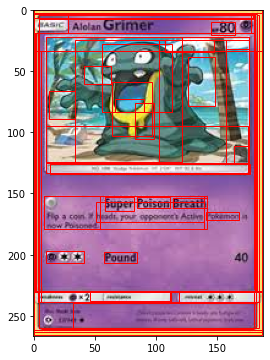

[INFO] classifying ROIs...
42.jpg


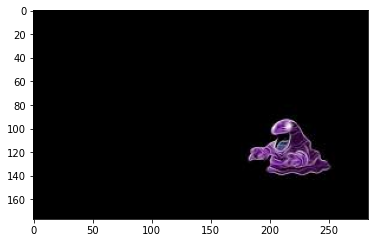

There is 9 regions proposed
All image regions have been created


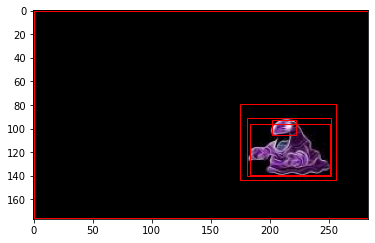

[INFO] classifying ROIs...
43.jpg


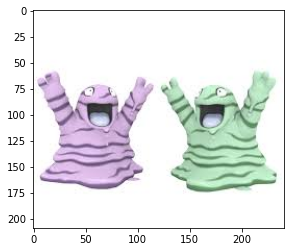

There is 33 regions proposed
All image regions have been created


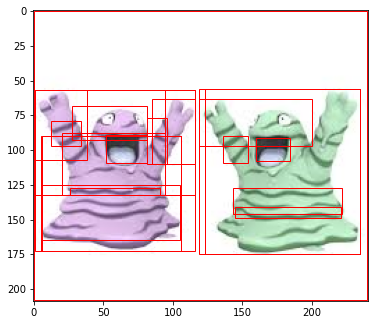

[INFO] classifying ROIs...
44.jpg


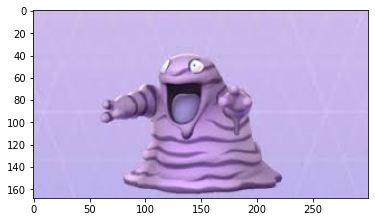

There is 19 regions proposed
All image regions have been created


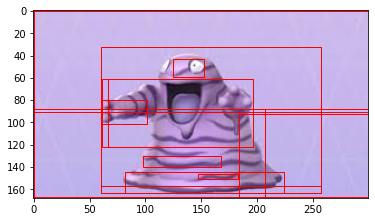

[INFO] classifying ROIs...
45.jpg


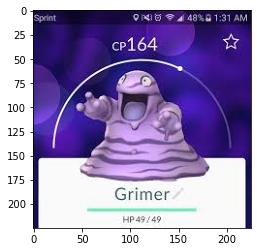

There is 51 regions proposed
All image regions have been created


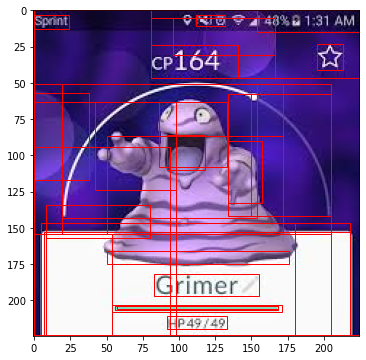

[INFO] classifying ROIs...
46.jpg


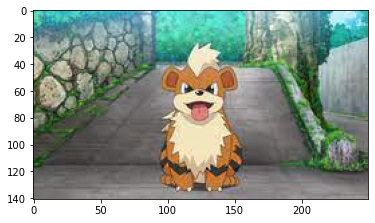

There is 37 regions proposed
All image regions have been created


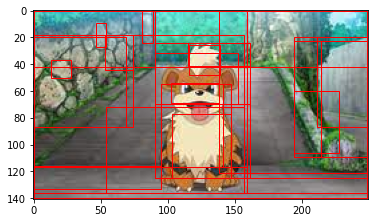

[INFO] classifying ROIs...
47.jpg


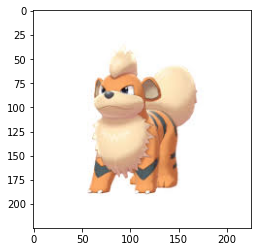

There is 21 regions proposed
All image regions have been created


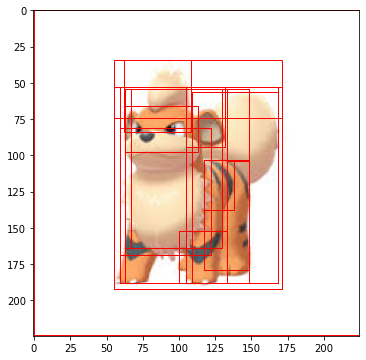

[INFO] classifying ROIs...
48.jpg


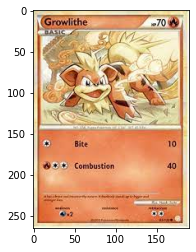

There is 79 regions proposed
All image regions have been created


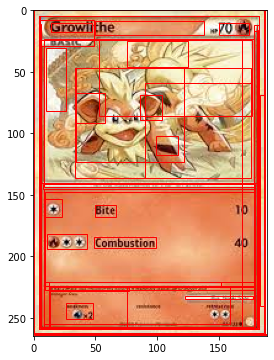

[INFO] classifying ROIs...
49.jpg


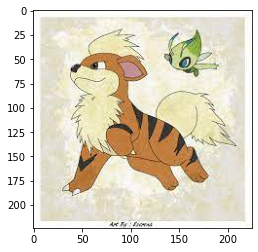

There is 64 regions proposed
All image regions have been created


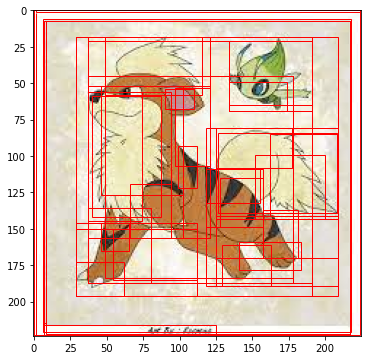

[INFO] classifying ROIs...
5.jpg


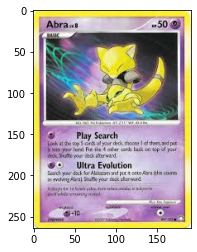

There is 113 regions proposed
All image regions have been created


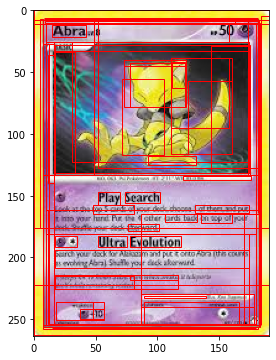

[INFO] classifying ROIs...
50.jpg


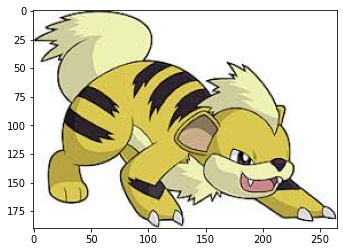

There is 67 regions proposed
All image regions have been created


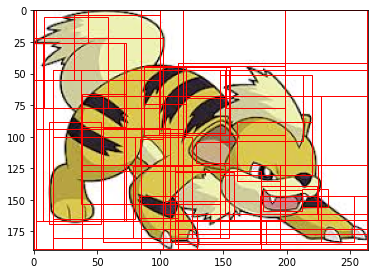

[INFO] classifying ROIs...
51.jpg


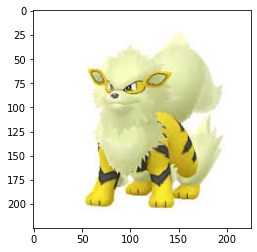

There is 27 regions proposed
All image regions have been created


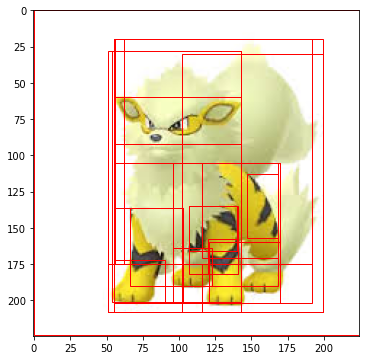

[INFO] classifying ROIs...
52.jpg


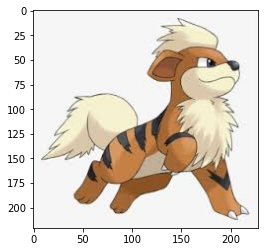

There is 37 regions proposed
All image regions have been created


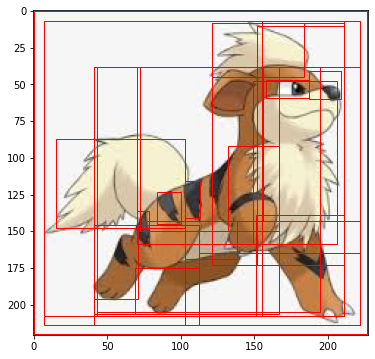

[INFO] classifying ROIs...
53.jpg


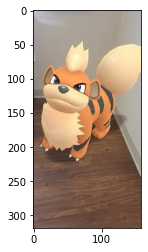

There is 35 regions proposed
All image regions have been created


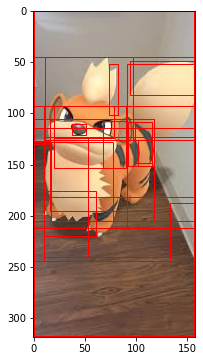

[INFO] classifying ROIs...
54.jpg


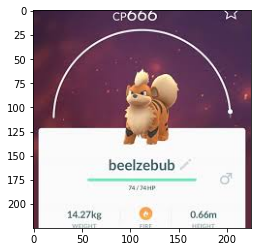

There is 49 regions proposed
All image regions have been created


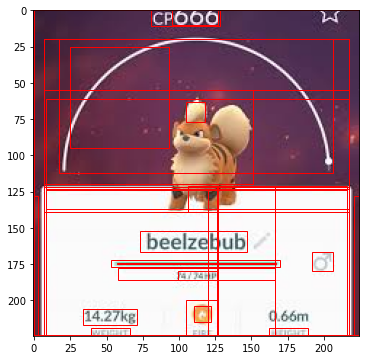

[INFO] classifying ROIs...
56.jpg


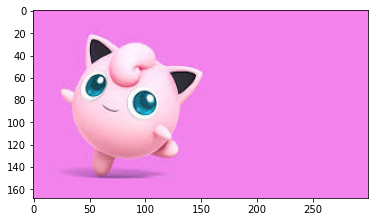

There is 19 regions proposed
All image regions have been created


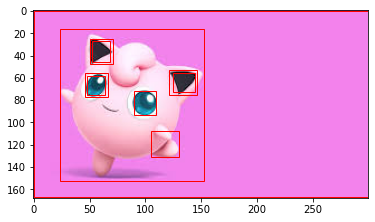

[INFO] classifying ROIs...
57.jpg


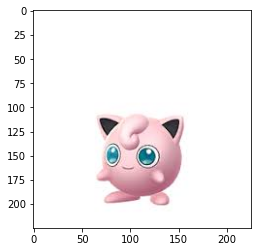

There is 17 regions proposed
All image regions have been created


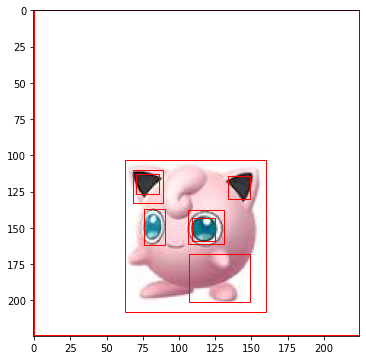

[INFO] classifying ROIs...
58.jpg


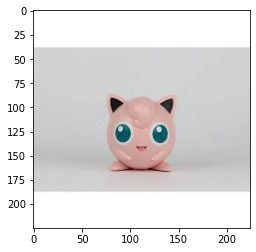

There is 24 regions proposed
All image regions have been created


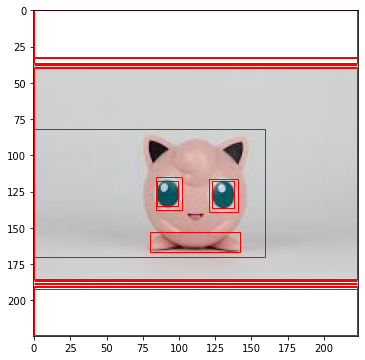

[INFO] classifying ROIs...
59.jpg


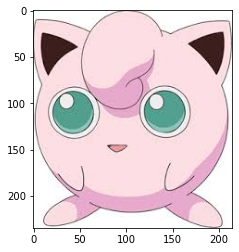

There is 43 regions proposed
All image regions have been created


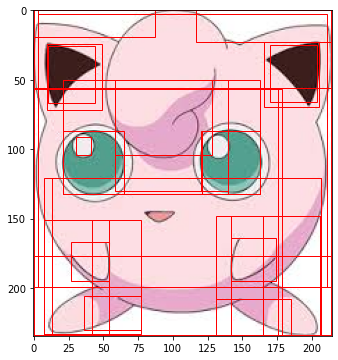

[INFO] classifying ROIs...
6.jpg


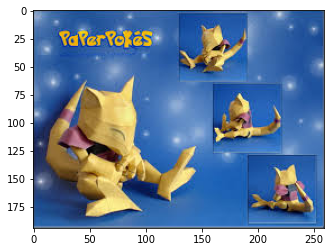

There is 61 regions proposed
All image regions have been created


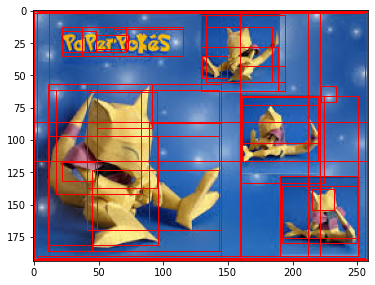

[INFO] classifying ROIs...
60.jpg


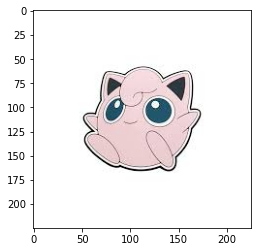

There is 25 regions proposed
All image regions have been created


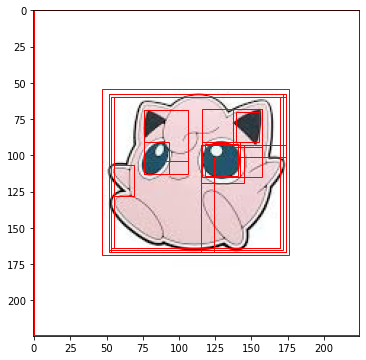

[INFO] classifying ROIs...
61.jpg


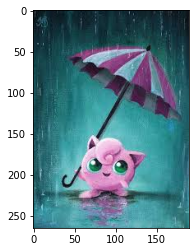

There is 25 regions proposed
All image regions have been created


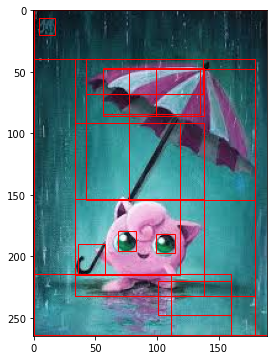

[INFO] classifying ROIs...
62.jpg


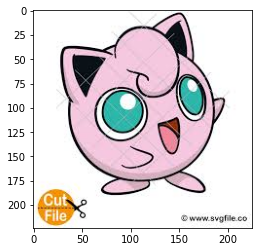

There is 57 regions proposed
All image regions have been created


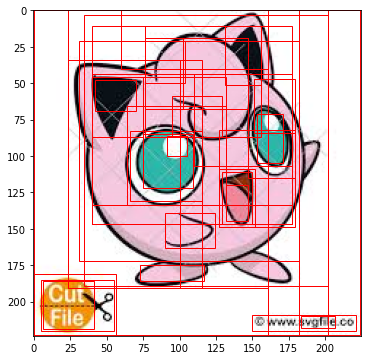

[INFO] classifying ROIs...
63.jpg


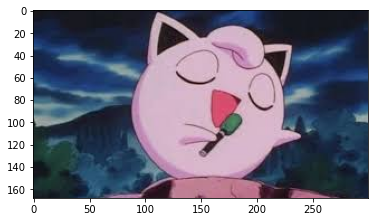

There is 63 regions proposed
All image regions have been created


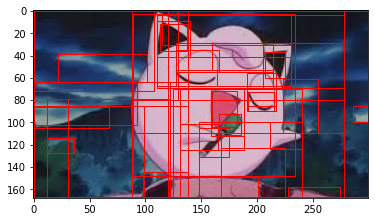

[INFO] classifying ROIs...
64.jpg


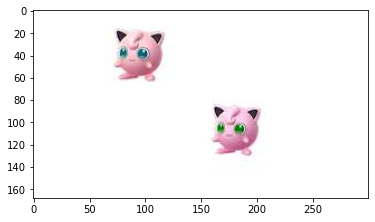

There is 9 regions proposed
All image regions have been created


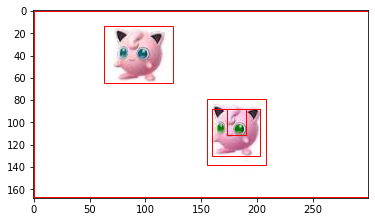

[INFO] classifying ROIs...
65.jpg


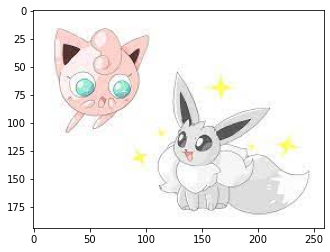

There is 29 regions proposed
All image regions have been created


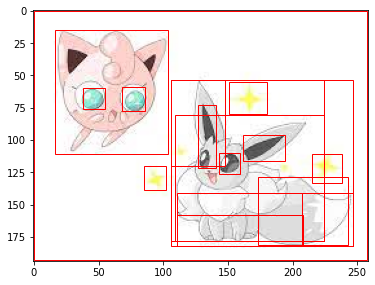

[INFO] classifying ROIs...
66.jpg


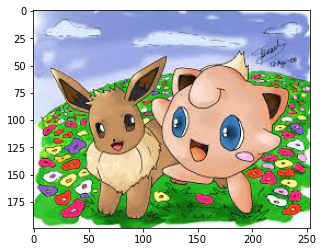

There is 87 regions proposed
All image regions have been created


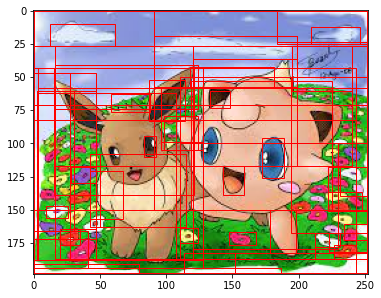

[INFO] classifying ROIs...
67.jpg


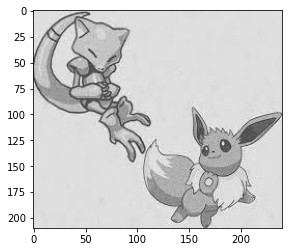

There is 43 regions proposed
All image regions have been created


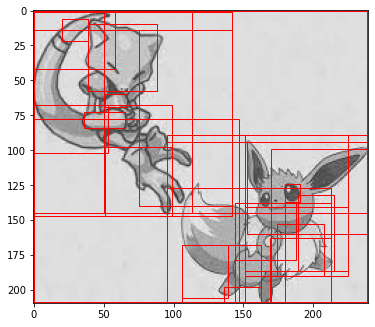

[INFO] classifying ROIs...
68.jpg


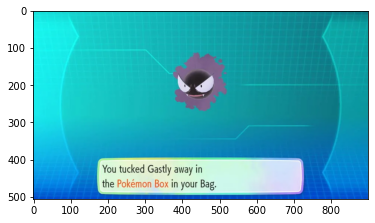

There is 179 regions proposed
All image regions have been created


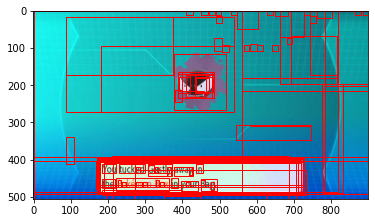

[INFO] classifying ROIs...
69.jpg


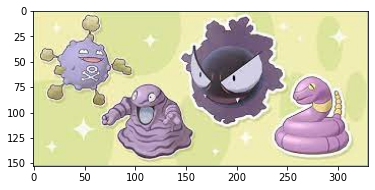

There is 55 regions proposed
All image regions have been created


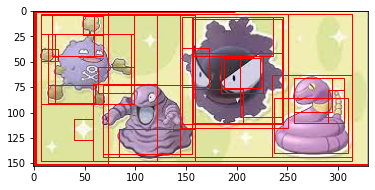

[INFO] classifying ROIs...
7.jpg


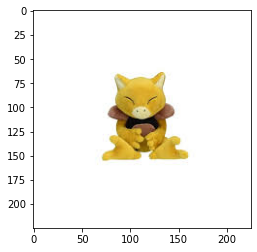

There is 13 regions proposed
All image regions have been created


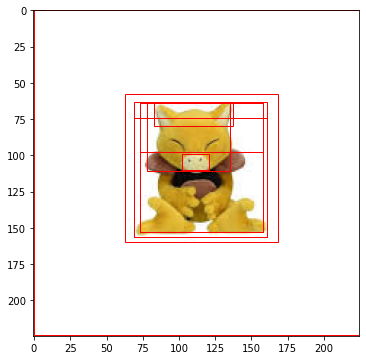

[INFO] classifying ROIs...
70.jpg


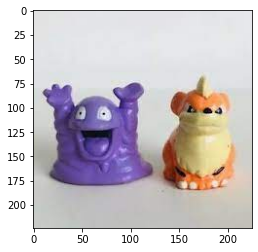

There is 27 regions proposed
All image regions have been created


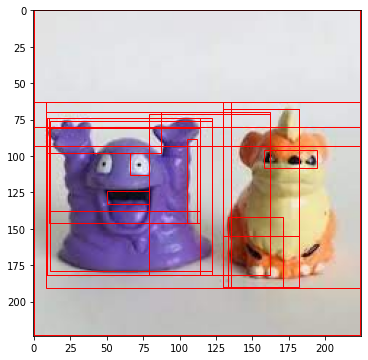

[INFO] classifying ROIs...
71.jpg


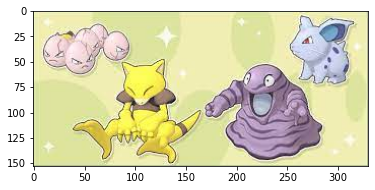

There is 50 regions proposed
All image regions have been created


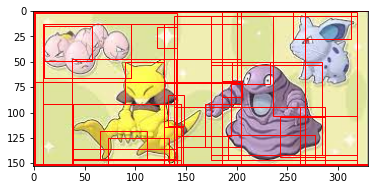

[INFO] classifying ROIs...
8.jpg


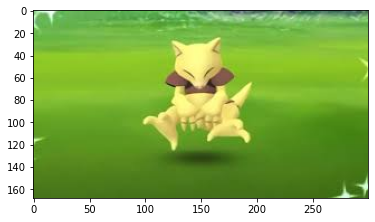

There is 22 regions proposed
All image regions have been created


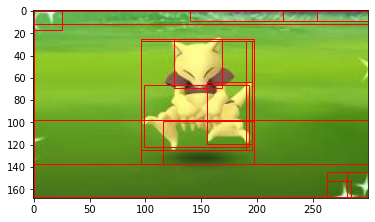

[INFO] classifying ROIs...
9.jpg


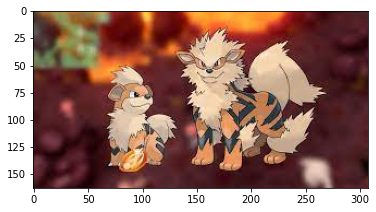

There is 55 regions proposed
All image regions have been created


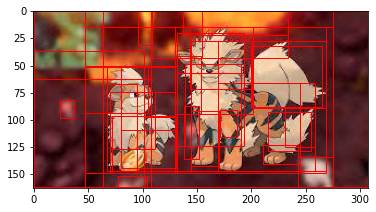

[INFO] classifying ROIs...
0.29372151143134334


In [8]:
average_iou = 0
count = 0

for index, test_image in enumerate(test_files):
    test_image = cv2.cvtColor(cv2.imread(test_image), cv2.COLOR_BGR2RGB)
    file_name = test_labels[index].split("\\")[2] + ".jpg"
    if file_name in test_info:
        true_regions = test_info[file_name]
    else:
        true_regions = "Other"
    print(file_name)
    
    reg_prop, raw_regions = get_regions_propsal(test_image)

    print("All image regions have been created")
    ShowRegionProposal(raw_regions, test_image)

    proposals = list()
    
    for region, coordinates in reg_prop:
        
        x = cv2.resize(np.asarray(region* 255, np.uint8), (128, 128), interpolation=cv2.INTER_CUBIC)
        #x = image.img_to_array(x)
        #x = preprocess_input(x)
        proposals.append(x)

    # classify each of the proposal ROIs
    print("[INFO] classifying ROIs...")

    proposals = get_hog_features(proposals)

    preds = model.predict(proposals)
    preds_classes = np.argmax(preds, axis=-1)
    
    # labels for ROIs
    labels = {}    
    
    # loop over the predictions
    for (i, p) in enumerate(preds_classes):
        # prediction information
        label = classes[p]
        prob = preds[i][p]
        
        # confidence = minmum probability 
        if prob >= confidence and label != "Other":
            # bounding box
            box = reg_prop[i][1]
            L = labels.get(label, [])
            L.append(((box[0], box[1], box[0]+box[2], box[1] + box[3]), prob))
            labels[label] = L
    
    # Copy original image
    original = test_image.copy()
    
    # loop over the labels for each of detected objects in the image
    for label in labels.keys():
        
        #Color for frame
        color = colors[classes.index(label)]
        
        # Bounding boxes and predictions
        boxes = np.array([p[0] for p in labels[label]])
        proba = np.array([p[1] for p in labels[label]])
        
        # Apply nms
        boxes = non_max_suppression(boxes, proba, overlapThresh=0.65)
        
        # loop over all bounding boxes
        for (startX, startY, endX, endY) in boxes:
            
            # Draw rectangles
            cv2.rectangle(original, (startX, startY), (endX, endY), color, 2)
            y = startY - 10 if startY - 10 > 10 else startY + 10
            cv2.putText(original, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 2)
            
            max_iou = 0
            if true_regions == "Other":
                continue 
            for true_region in true_regions:
                iou = jaccard_index((int(true_region[2]),int(true_region[1]),int(true_region[4]),int(true_region[3]))
                                   ,(startY, startX, endY, endX))
                if iou > max_iou:
                    max_iou = iou
            #print(max_iou)
            average_iou += max_iou
            count += 1
    # Save image        
    path = 'C://Users//rajno//Desktop//pokemon-detection-and-classification//data//result'
    cv2.imwrite(os.path.join(path , file_name), cv2.cvtColor(original, cv2.COLOR_RGB2BGR))
    cv2.waitKey(0)

average_iou = average_iou/count
print(average_iou)